In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import seaborn as sns

In [2]:
import folium

In [3]:
df_grade = gpd.read_file("/home/scosta/Insync/sergio.costa@ufma.br/Google Drive/Organizacao/Dados/vetoriais/desmatamento/processado/grade_cerrado_ma_prodes.zip")
df_grade.head()

,top,left,bottom,target_per,right,id,2000_targe,d001_23,d2000,geometry
0,-5.237088,-47.939596,-5.320088,14.806995,-47.856596,40806,45.265392,14.806995,45.265392,"POLYGON ((-47.90064 -5.25347, -47.90064 -5.252..."
1,-5.320088,-47.939596,-5.403088,20.770221,-47.856596,40807,3.324870,20.770221,3.324870,"POLYGON ((-47.86840 -5.32758, -47.86804 -5.324..."
2,-5.237088,-47.856596,-5.320088,23.453269,-47.773596,41076,70.774158,23.453269,70.774158,"POLYGON ((-47.85660 -5.32009, -47.85660 -5.272..."
3,-5.320088,-47.856596,-5.403088,31.868517,-47.773596,41077,5.205989,31.868517,5.205989,"POLYGON ((-47.85660 -5.36082, -47.85660 -5.320..."
4,-5.237088,-47.773596,-5.320088,1.231868,-47.690596,41346,97.476698,1.231868,97.476698,"MULTIPOLYGON (((-47.77360 -5.32009, -47.77360 ..."


In [4]:
df_grade[df_grade["id"] == 44316]

,top,left,bottom,target_per,right,id,2000_targe,d001_23,d2000,geometry
291,-5.237088,-46.860596,-5.320088,0.0,-46.777596,44316,496.862745,0.0,496.862745,"MULTIPOLYGON (((-46.80325 -5.32009, -46.80283 ..."


In [5]:
#celula com valor errado 44316
df_grade = df_grade[df_grade["id"] != 44316]

In [6]:
df_grade

,top,left,bottom,target_per,right,id,2000_targe,d001_23,d2000,geometry
0,-5.237088,-47.939596,-5.320088,14.806995,-47.856596,40806,45.265392,14.806995,45.265392,"POLYGON ((-47.90064 -5.25347, -47.90064 -5.252..."
1,-5.320088,-47.939596,-5.403088,20.770221,-47.856596,40807,3.324870,20.770221,3.324870,"POLYGON ((-47.86840 -5.32758, -47.86804 -5.324..."
2,-5.237088,-47.856596,-5.320088,23.453269,-47.773596,41076,70.774158,23.453269,70.774158,"POLYGON ((-47.85660 -5.32009, -47.85660 -5.272..."
3,-5.320088,-47.856596,-5.403088,31.868517,-47.773596,41077,5.205989,31.868517,5.205989,"POLYGON ((-47.85660 -5.36082, -47.85660 -5.320..."
4,-5.237088,-47.773596,-5.320088,1.231868,-47.690596,41346,97.476698,1.231868,97.476698,"MULTIPOLYGON (((-47.77360 -5.32009, -47.77360 ..."
...,...,...,...,...,...,...,...,...,...,...
2801,-2.747088,-41.880596,-2.830088,0.344204,-41.797596,60486,1.461126,0.344204,1.461126,"POLYGON ((-41.88059 -2.83009, -41.88059 -2.747..."
2802,-2.830088,-41.880596,-2.913088,0.648848,-41.797596,60487,0.000000,0.648848,0.000000,"POLYGON ((-41.88059 -2.91309, -41.88059 -2.830..."
2803,-2.913088,-41.880596,-2.996088,11.179439,-41.797596,60488,12.337390,11.179439,12.337390,"POLYGON ((-41.88059 -2.99609, -41.88059 -2.913..."
2804,-2.996088,-41.880596,-3.079088,26.780587,-41.797596,60489,15.765769,26.780587,15.765769,"POLYGON ((-41.88059 -3.07665, -41.88059 -2.996..."


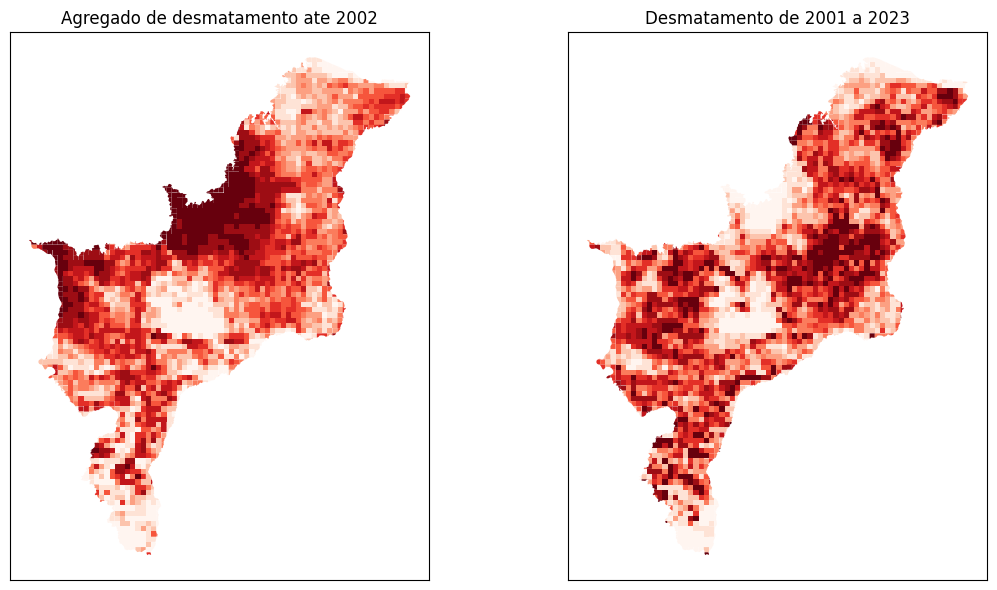

In [7]:
# Dividir a área de plotagem em dois subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 6))


ax1 =  df_grade.plot(
    ax=axs[0],
    column="d2000",  # Data to plot
    scheme="quantiles",  # Classification scheme
    k=10,
    cmap="Reds",  # Color palette
    #legend=True,  # Add legend
    #legend_kwds={"fmt": "{:.0f}"},  # Remove decimals in legend
    figsize=(10,100),
    #edgecolor='black', linewidth=0.1,
)


axs[0].set_title('Agregado de desmatamento ate 2002')




ax2 = df_grade.plot(
    ax=axs[1],
    column="d001_23",  # Data to plot
    scheme="quantiles",  # Classification scheme
    k=10,
    cmap="Reds",  # Color palette
    #legend=True,  # Add legend
    #legend_kwds={"fmt": "{:.0f}"},  # Remove decimals in legend
    figsize=(10,100),
    #edgecolor='black', linewidth=0.1,
)

axs[1].set_title('Desmatamento de 2001 a 2023')



#axs[0].set_axis_off();
axs[0].set_xticks([])
axs[0].set_yticks([])

#axs[1].set_axis_off();
axs[1].set_xticks([])
axs[1].set_yticks([])

plt.tight_layout()  # Para ajustar os subplots para evitar sobreposição
plt.show()

In [8]:
df_grade["desmatamento_total"] = df_grade["d2000"] + df_grade["d001_23"]

In [9]:
mapa = folium.Map(location = [-4.4671541,-43.9278995,],
                      zoom_start = 7,
                      tiles = 'OpenStreetMap')

folium.Choropleth(geo_data = df_grade,
                  data= df_grade,
                  columns = ['id','d2000'],
                  key_on = 'feature.properties.id',
                  fill_color = 'RdYlGn_r',
                  nan_fill_color = 'white',
                  bins = 10,
                  highlight = True,
                  line_opacity=0,
                  legend_name = 'Porcentagem de Desmatamento').add_to(mapa)


mapa

In [10]:
mapa = folium.Map(location = [-4.4671541,-43.9278995,],
                      zoom_start = 7,
                      tiles = 'OpenStreetMap')

folium.Choropleth(geo_data = df_grade,
                  data= df_grade,
                  columns = ['id','desmatamento_total'],
                  key_on = 'feature.properties.id',
                  fill_color = 'RdYlGn_r',
                  nan_fill_color = 'white',
                  bins = 4,
                  highlight = True,
                  line_opacity=0,
                  legend_name = 'Porcentagem de Desmatamento').add_to(mapa)


mapa

<Axes: >

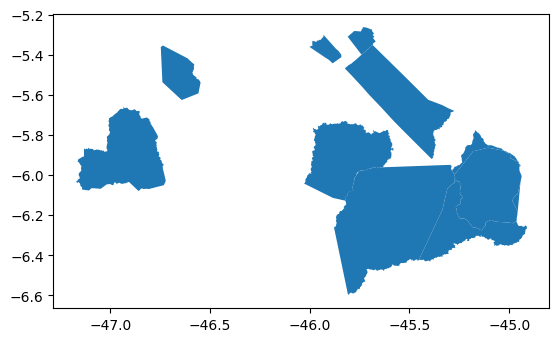

In [17]:
gdf_ti = gpd.read_file("/home/scosta/Insync/sergio.costa@ufma.br/Google Drive/Organizacao/Dados/vetoriais/limites/tis_selecionadas.shp")
gdf_ti.plot()

In [20]:
mapa = folium.Map(location = [-4.4671541,-43.9278995,],
                      zoom_start = 7,
                      tiles = 'OpenStreetMap')

folium.Choropleth(geo_data = df_grade,
                  data= df_grade,
                  columns = ['id','desmatamento_total'],
                  key_on = 'feature.properties.id',
                  fill_color = 'RdYlGn_r',
                  nan_fill_color = 'white',
                  bins = 4,
                  highlight = True,
                  line_opacity=0,
                  legend_name = 'Porcentagem de Desmatamento').add_to(mapa)

# Adicionar a camada do GeoDataFrame ao mapa
folium.GeoJson(
    gdf_ti.to_json(),
    name='Camada GeoPandas',
    style_function=lambda x: {'weight': 1, 'color': 'black'}
).add_to(mapa)


mapa

In [66]:
import mapclassify

In [72]:

quantiles = mapclassify.Quantiles(df_grade['d001_23'], k=5)
df_grade['quantiles'] = quantiles.yb



In [73]:
natural_breaks = mapclassify.NaturalBreaks(df_grade['d001_23'], k=5)
df_grade['natural_breaks'] = natural_breaks.yb

/home/scosta/developer/analise_cerrado_maranhense/.venv/lib/python3.10/site-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [74]:
mapa = folium.Map(location = [-4.4671541,-43.9278995,],
                      zoom_start = 7,
                      tiles = 'OpenStreetMap')

folium.Choropleth(geo_data = df_grade,
                  data= df_grade,
                  name='Equal Interval',
                  columns = ['id','natural_breaks'],
                  key_on = 'feature.properties.id',
                  fill_color = 'RdYlGn_r',
                  nan_fill_color = 'white',
                  #bins = 4,
                  highlight = True,
                  line_opacity=0,
                  legend_name = 'Porcentagem de Desmatamento').add_to(mapa)


mapa

In [11]:
df_grade.to_file("temp/desmatamento_grade.shp")

/tmp/ipykernel_13474/4072238940.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  df_grade.to_file("temp/desmatamento_grade.shp")
